In [ ]:
!pip install mne


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 18.4 MB/s eta 0:00:00


In [ ]:
!pip install PyWavelets
import mne, glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat
import scipy.io
import mne
from scipy.signal import savgol_filter
import pywt


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 28.5 MB/s eta 0:00:00


Creating RawArray with float64 data, n_channels=32, n_times=3200
    Range : 0 ... 3199 =      0.000 ...    24.992 secs
Ready.


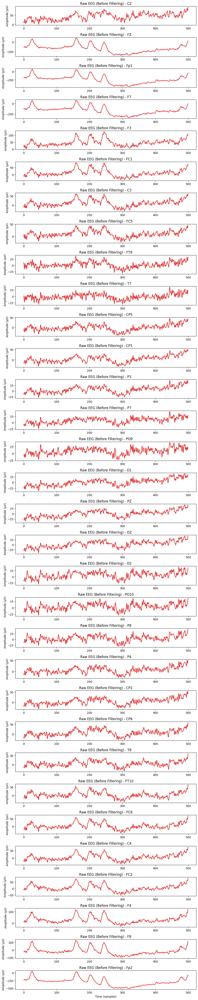

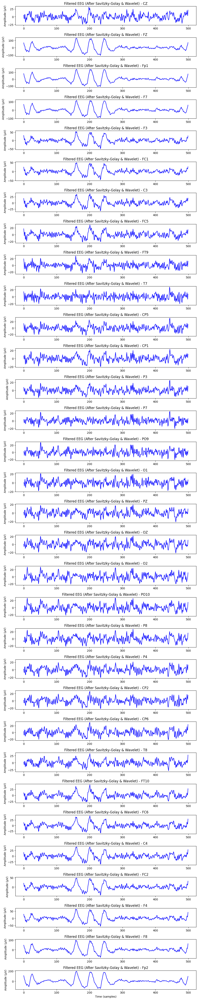

In [ ]:
import scipy.io
from scipy.signal import savgol_filter
import pywt
import numpy as np
import mne
import matplotlib.pyplot as plt

# Load EEG data
data = scipy.io.loadmat('/content/Mirror_image_sub_6_trial2.mat')
np_arr = np.array(data['Data'])

# EEG Info
sfreq = 128  # Sampling frequency
ch_names = ['CZ', 'FZ', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9',
            'O1', 'PZ', 'OZ', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4',
            'F8', 'Fp2']
ch_types = ['eeg'] * 32

# Create MNE Raw object
info = mne.create_info(ch_names, sfreq, ch_types)
raw = mne.io.RawArray(np_arr, info)

# Plot raw data before filtering
fig, axes = plt.subplots(nrows=32, ncols=1, figsize=(10, 50))
for i in range(32):
    axes[i].plot(raw.get_data()[i, :500], color='red')
    axes[i].set_title(f"Raw EEG (Before Filtering) - {ch_names[i]}")
    axes[i].set_ylabel("Amplitude (µV)")
plt.xlabel("Time (samples)")
plt.tight_layout()
plt.show()

# Apply Savitzky-Golay filter
sg_filter = savgol_filter(raw.get_data(), 127, 5, axis=1)
raw_data = raw.get_data() - sg_filter  # Remove the trend

# Apply Wavelet Denoising
coeffs = pywt.wavedec(raw_data, 'db2', level=4, axis=1)
threshold = 0.8 * np.std(coeffs[2], axis=1, keepdims=True)
coeffs[2] = pywt.threshold(coeffs[2], threshold, mode='soft', substitute=0)
filtered_data = pywt.waverec(coeffs, 'db2', axis=1)

# Plot filtered data
fig, axes = plt.subplots(nrows=32, ncols=1, figsize=(10, 50))
for i in range(32):
    axes[i].plot(filtered_data[i, :500], color='blue')
    axes[i].set_title(f"Filtered EEG (After Savitzky-Golay & Wavelet) - {ch_names[i]}")
    axes[i].set_ylabel("Amplitude (µV)")
plt.xlabel("Time (samples)")
plt.tight_layout()
plt.show()


**EEG Data Preprocessing and Artifact Removal**

Creating RawArray with float64 data, n_channels=32, n_times=3200
    Range : 0 ... 3199 =      0.000 ...    24.992 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 845 samples (6.602 s)

Creating RawArray with float64 data, n_channels=32, n_times=3200
    Range : 0 ... 3199 =      0.000 ...    24.992 secs
Ready.
Using matplotlib as 2D backend.


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


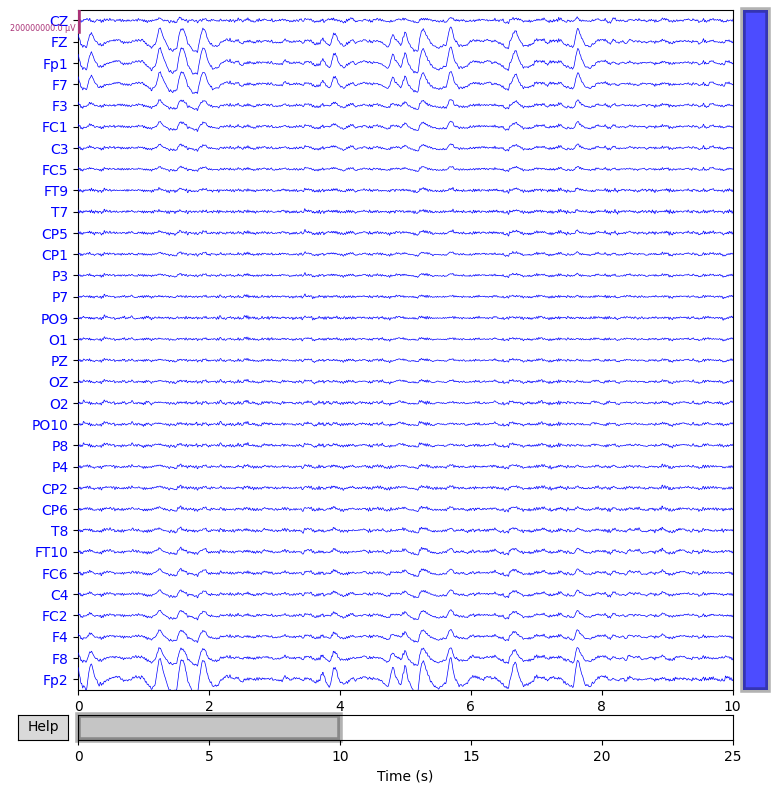

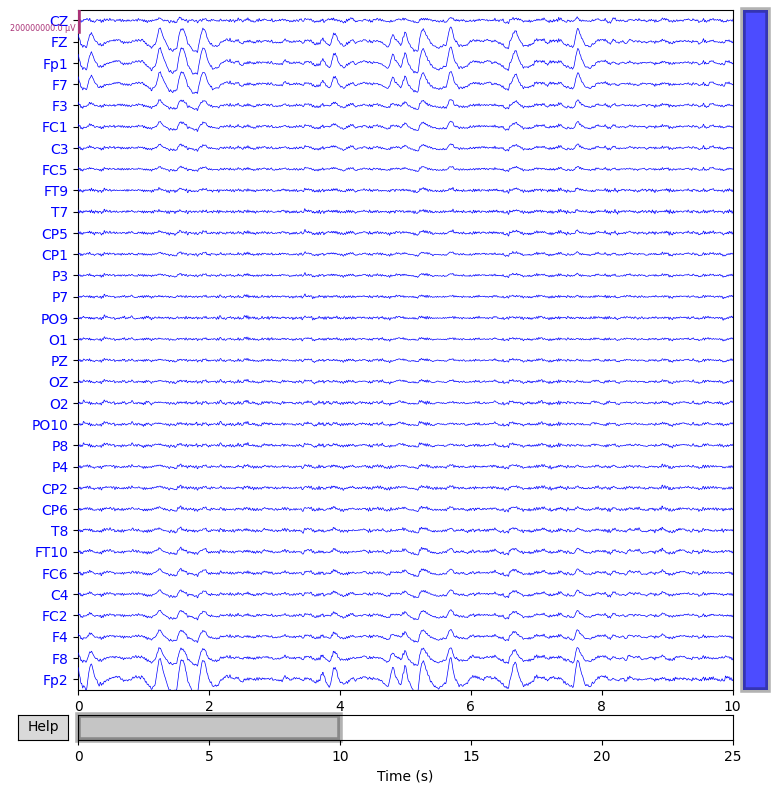

In [ ]:
import scipy.io
from scipy.signal import savgol_filter
import pywt
import numpy as np
import mne

data = scipy.io.loadmat('/content/Mirror_image_sub_6_trial2.mat')
np_arr = np.array(data['Data'])

sfreq = 128
ch_names = ['CZ', 'FZ', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'PZ', 'OZ', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
ch_types = ['eeg'] * 32

info = mne.create_info(ch_names, sfreq, ch_types)
raw = mne.io.RawArray(np_arr, info)
raw.filter(0.5, 45)

sg_filter = savgol_filter(raw.get_data(), 127, 5, axis=1)
raw_data = raw.get_data() - sg_filter

coeffs = pywt.wavedec(raw_data, 'db2', level=4, axis=1)
threshold = 0.8 * np.std(coeffs[2], axis=1, keepdims=True)
coeffs[2] = pywt.threshold(coeffs[2], threshold, mode='soft', substitute=0)
raw_data = pywt.waverec(coeffs, 'db2', axis=1)

raw = mne.io.RawArray(raw_data, info)
color = 'blue'
raw.plot(n_channels=32, title='EEG data of Subject 6, Trial 2, Mirror Image Task', color=color, scalings={'eeg': 100})

**Topographical Analysis**

Creating RawArray with float64 data, n_channels=32, n_times=3200
    Range : 0 ... 3199 =      0.000 ...    24.992 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 845 samples (6.602 s)

Creating RawArray with float64 data, n_channels=32, n_times=3200
    Range : 0 ... 3199 =      0.000 ...    24.992 secs
Ready.


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


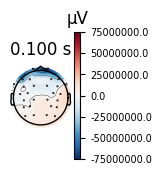

In [ ]:

data = scipy.io.loadmat('/content/Mirror_image_sub_6_trial2.mat')
np_arr = np.array(data['Data'])

sfreq = 128
ch_names = ['CZ', 'FZ', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'PZ', 'OZ', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
ch_types = ['eeg'] * 32

info = mne.create_info(ch_names, sfreq, ch_types)
montage = mne.channels.make_standard_montage('standard_1020')
info.set_montage(montage, on_missing='ignore')

raw = mne.io.RawArray(np_arr, info)
raw.filter(0.5, 45)

sg_filter = savgol_filter(raw.get_data(), 127, 5, axis=1)
raw_data = raw.get_data() - sg_filter

coeffs = pywt.wavedec(raw_data, 'db2', level=4, axis=1)
threshold = 0.8 * np.std(coeffs[2], axis=1, keepdims=True)
coeffs[2] = pywt.threshold(coeffs[2], threshold, mode='soft', substitute=0)
raw_data = pywt.waverec(coeffs, 'db2', axis=1)

raw = mne.io.RawArray(raw_data, info)
evoked = mne.EvokedArray(raw.get_data(), info)

picks = mne.pick_channels(evoked.info['ch_names'], include=['Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2'])
evoked_picked = evoked.copy().pick(picks)

evoked_picked.plot_topomap(times=0.1, ch_type='eeg')
plt.show()

**Power Spectral Analysis**

Creating RawArray with float64 data, n_channels=32, n_times=3200
    Range : 0 ... 3199 =      0.000 ...    24.992 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 845 samples (6.602 s)

Creating RawArray with float64 data, n_channels=32, n_times=3200
    Range : 0 ... 3199 =      0.000 ...    24.992 secs
Ready.


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


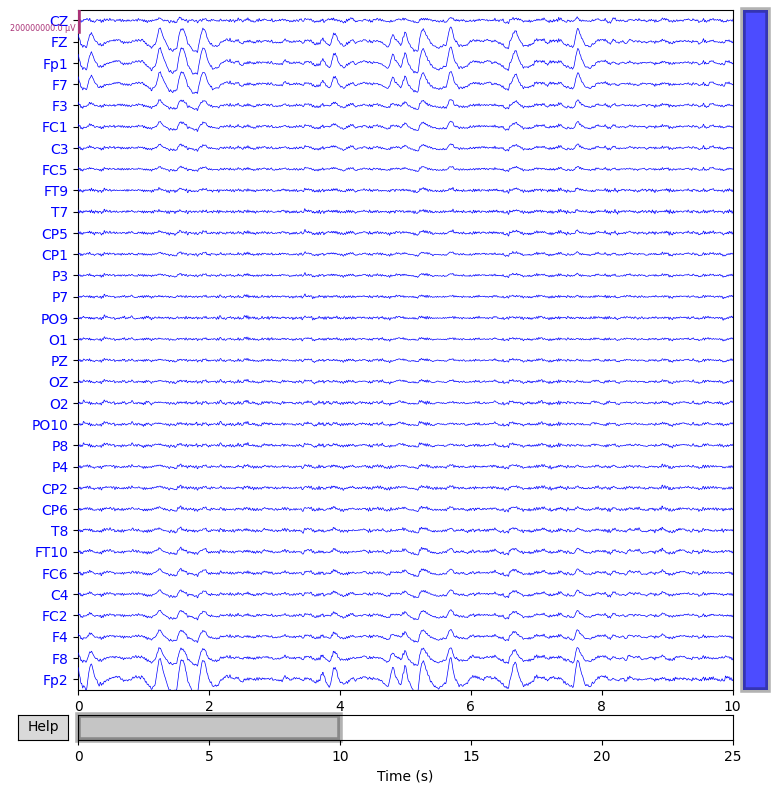

Effective window size : 2.000 (s)


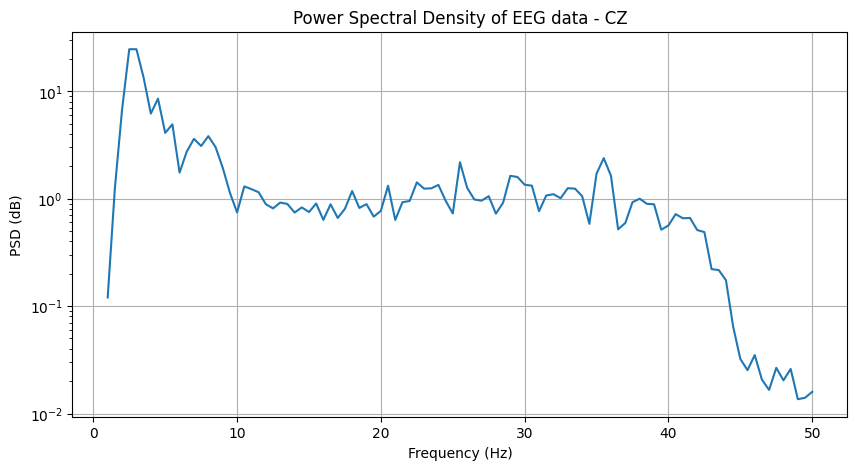

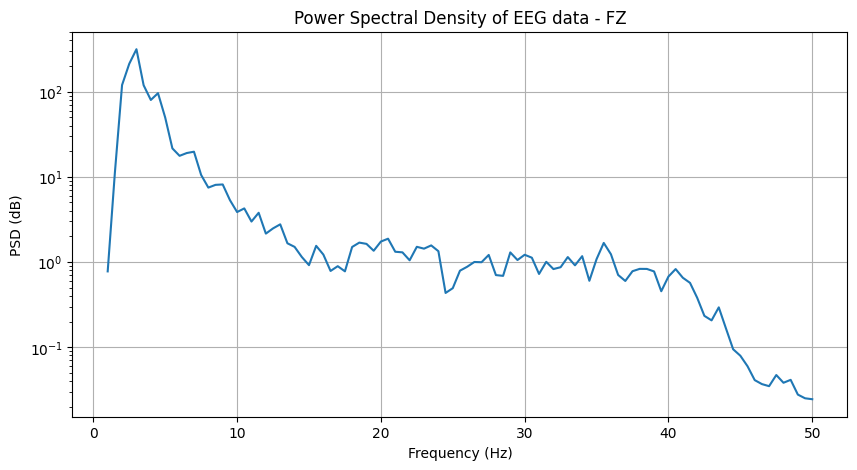

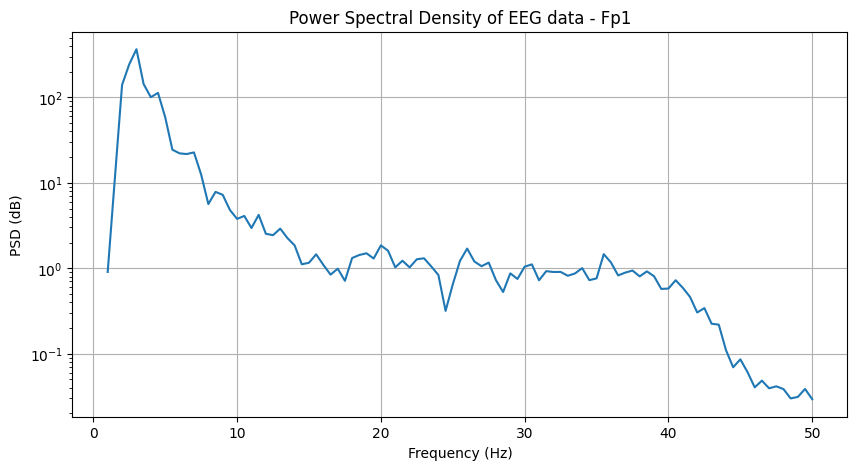

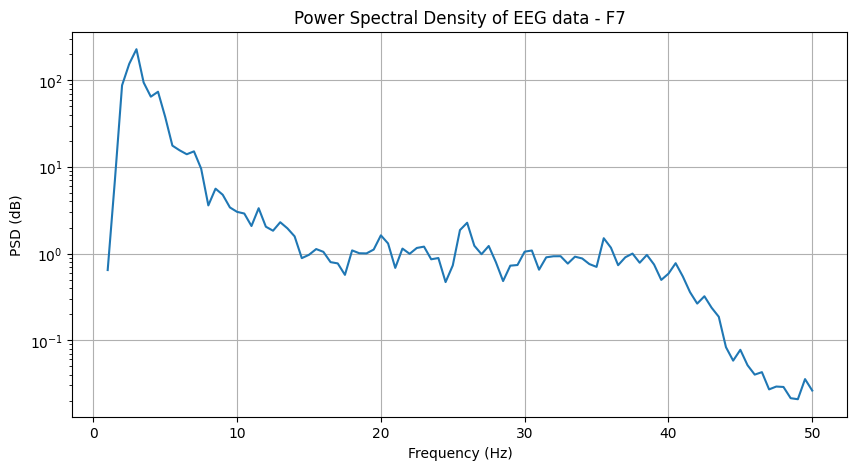

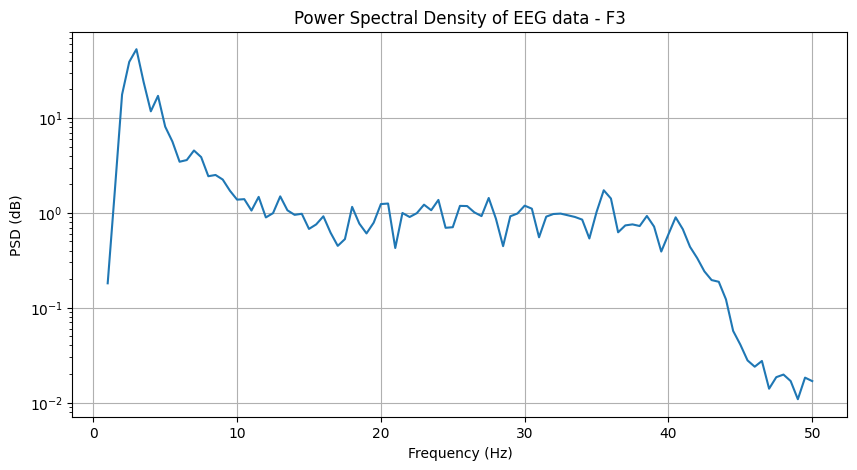

...

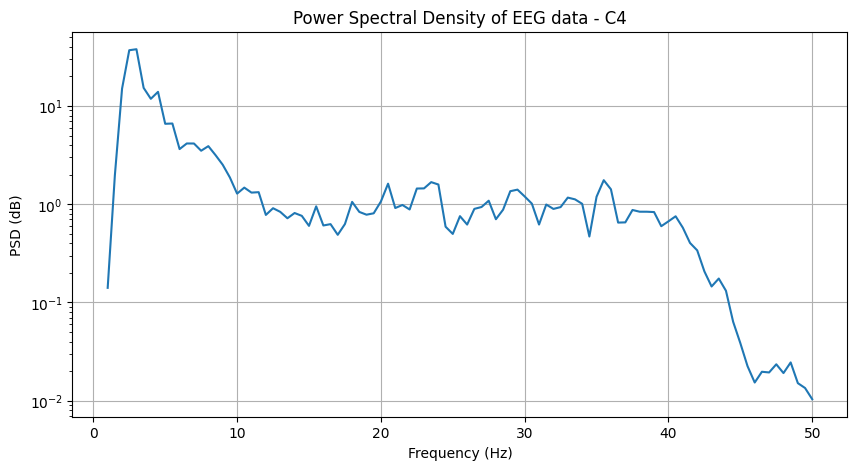

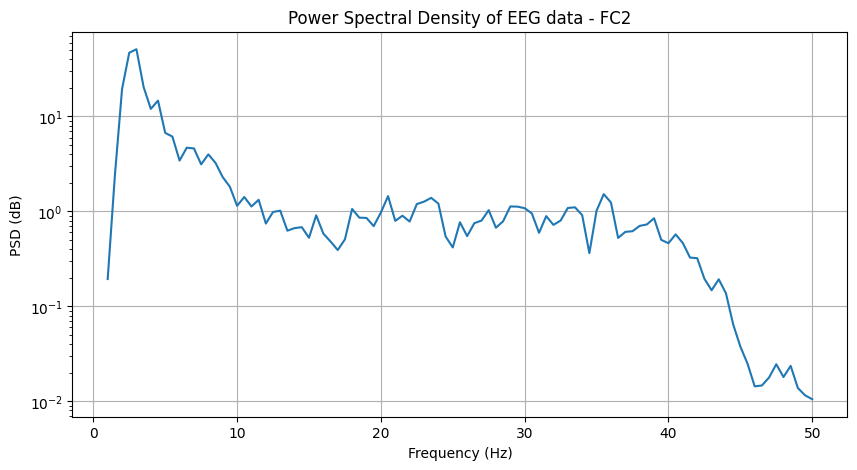

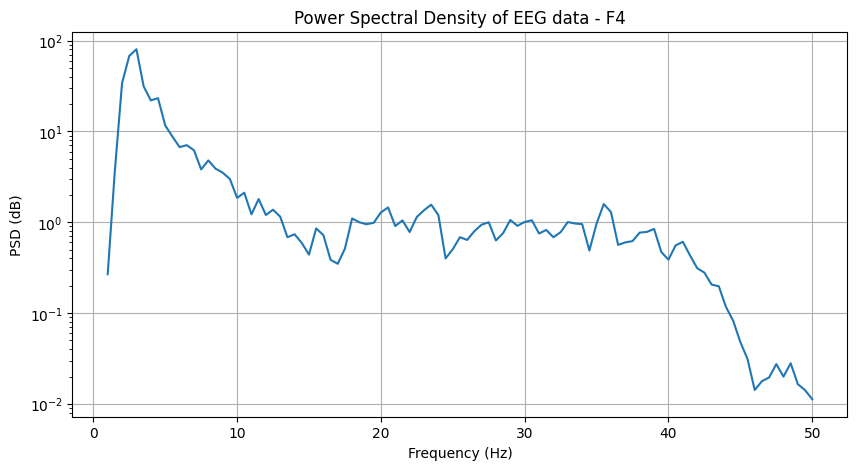

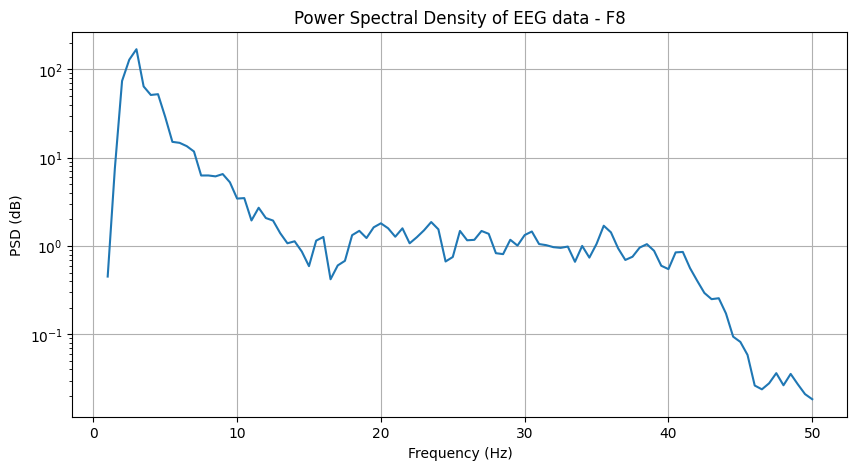

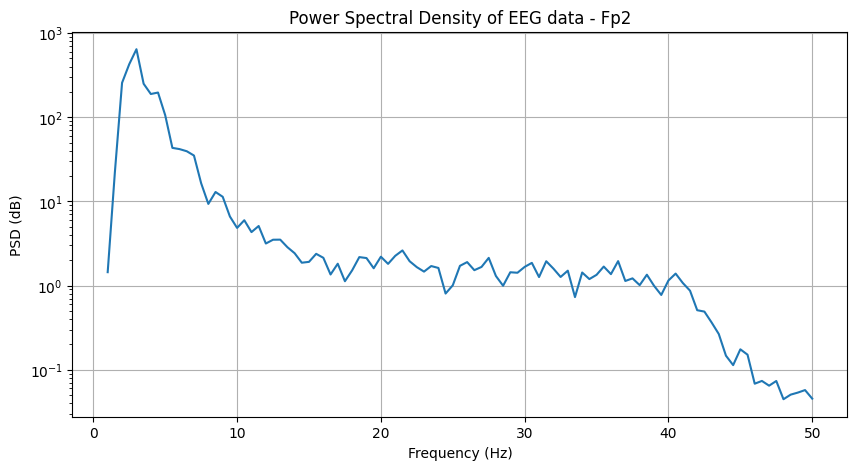

In [ ]:
data = scipy.io.loadmat('/content/Mirror_image_sub_6_trial2.mat')
try:
    np_arr = np.array(data['Data'])
except KeyError:
    print("Key 'Data' not found in the.mat file.")

sfreq = 128
ch_names = ['CZ', 'FZ', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'PZ', 'OZ', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
ch_types = ['eeg'] * 32

info = mne.create_info(ch_names, sfreq, ch_types)
raw = mne.io.RawArray(np_arr, info)
raw.filter(0.5, 45)

sg_filter = savgol_filter(raw.get_data(), 127, 5, axis=1)
raw_data = raw.get_data() - sg_filter
coeffs = pywt.wavedec(raw_data, 'db2', level=4, axis=1)
threshold = 0.8 * np.std(coeffs[2], axis=1, keepdims=True)
coeffs[2] = pywt.threshold(coeffs[2], threshold, mode='soft', substitute=0)
raw_data = pywt.waverec(coeffs, 'db2', axis=1)
raw = mne.io.RawArray(raw_data, info)

color = 'blue'
raw.plot(n_channels=32, title='EEG data of Subject 6, Trial 2, Mirror Image Task', color=color, scalings={'eeg': 100})

psd, freqs = mne.time_frequency.psd_array_welch(raw.get_data(), sfreq, fmin=1., fmax=50.)

for i in range(psd.shape[0]):
    plt.figure(figsize=(10, 5))
    plt.semilogy(freqs, psd[i, :])
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('PSD (dB)')
    plt.title('Power Spectral Density of EEG data - ' ch_names[i])
    plt.grid(True)
    plt.show()

**EEG Signal Topographical Analysis**

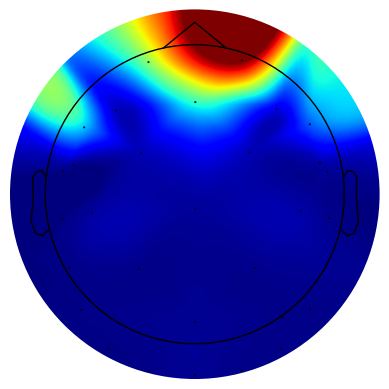

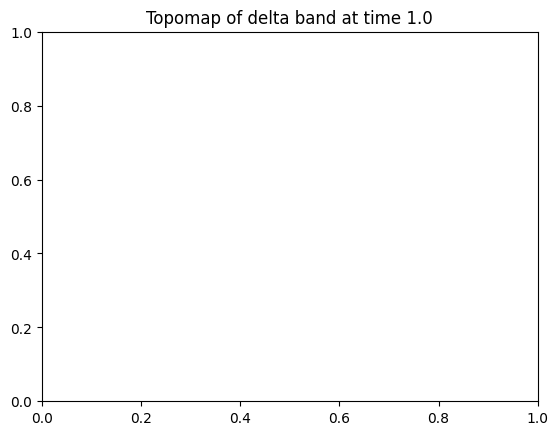

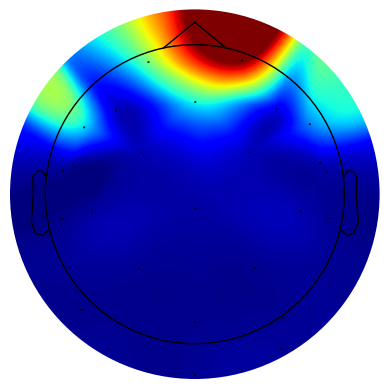

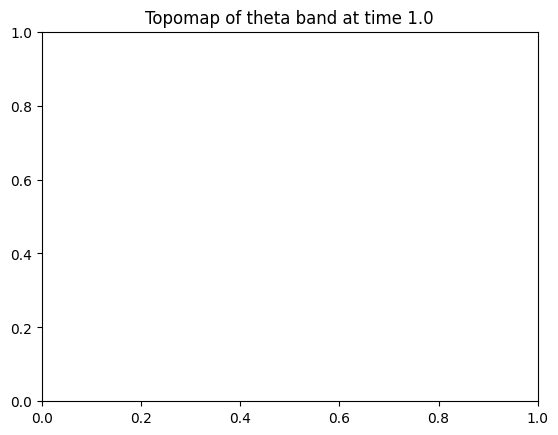

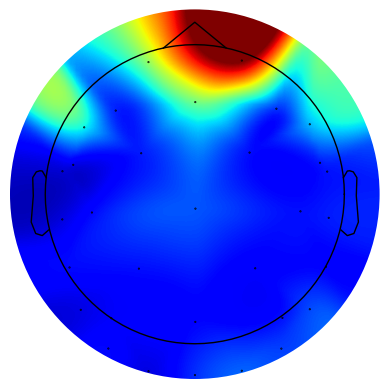

...

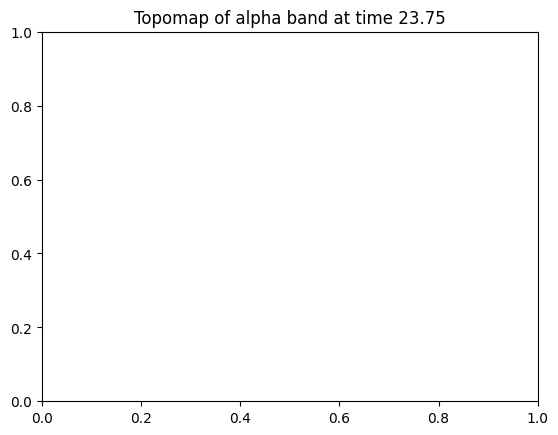

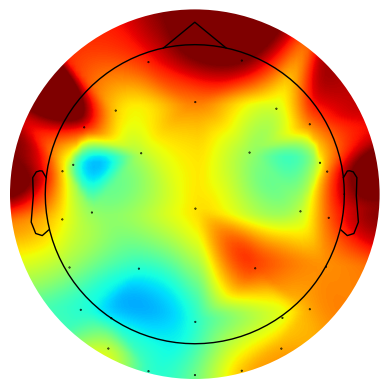

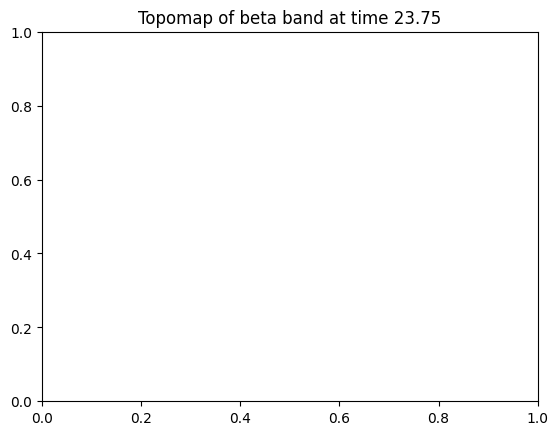

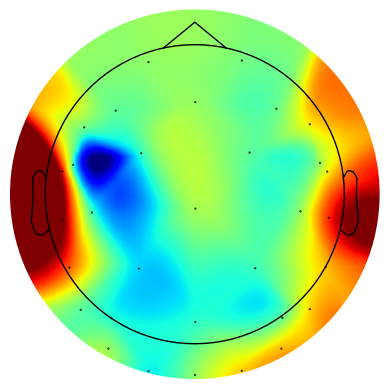

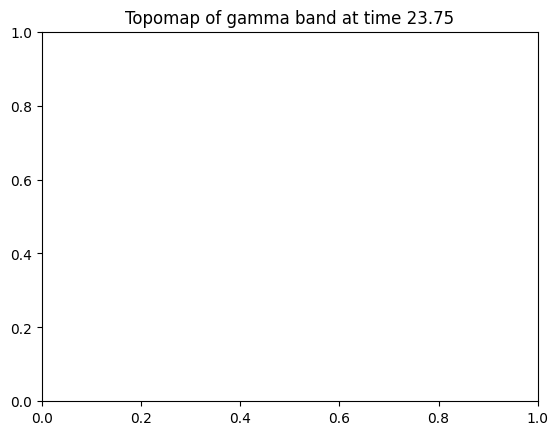

In [ ]:
import mne
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import spectrogram
import scipy.io

data = scipy.io.loadmat('/content/Mirror_image_sub_6_trial2.mat')
try:
    np_arr = np.array(data['Data'])
except KeyError:
    print("Key 'Data' not found in the.mat file.")

sfreq = 128
ch_names = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
ch_types = ['eeg'] * 32

bands = {'delta': (0.5, 4),
         'theta': (4, 8),
         'alpha': (8, 13),
         'beta': (13, 30),
         'gamma': (30, 45)}

frequencies, times, Sxx = spectrogram(np_arr, sfreq)
montage = mne.channels.make_standard_montage('standard_1020')
pos_dict = montage.get_positions()['ch_pos']
pos = np.array([pos_dict[ch_name][:2] for ch_name in ch_names])

for i in range(len(times)):
    psd = Sxx[:, :, i]
    psd_bands = {band: np.mean(psd[:, (frequencies >= fmin) & (frequencies <= fmax)], axis=1)
                 for band, (fmin, fmax) in bands.items()}
    for band, psd in psd_bands.items():
        fig, ax = plt.subplots()
        mne.viz.plot_topomap(psd, pos, axes=ax, cmap='jet', contours=0)
        plt.title(f'Topomap of {band} band at time {times[i]}')

**Power Spectral Density (PSD) Visualization**

Effective window size : 2.000 (s)


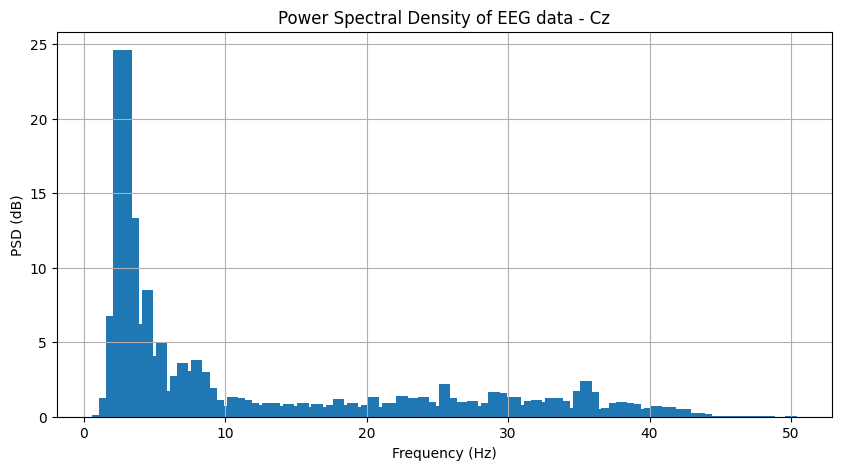

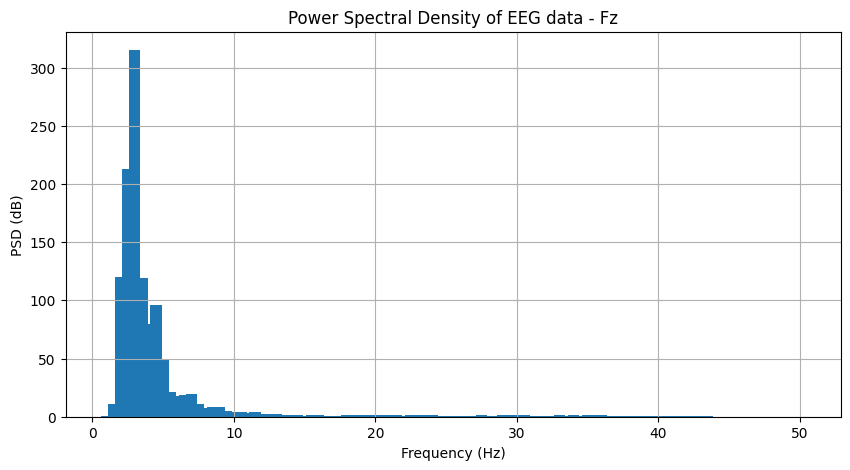

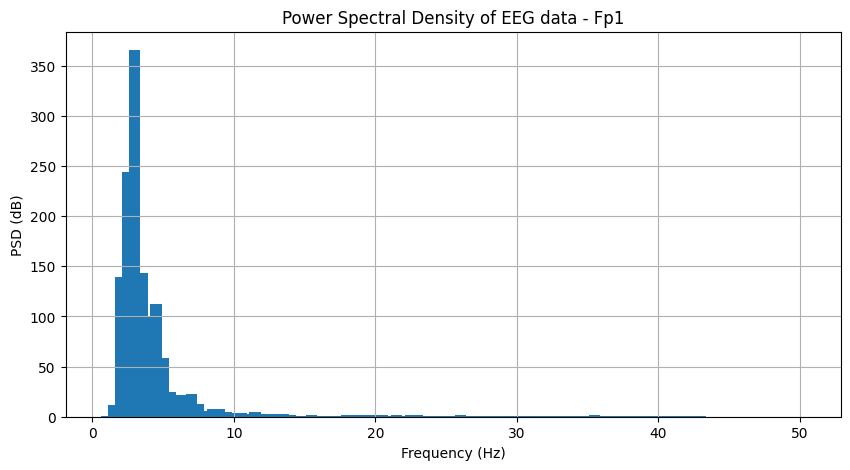

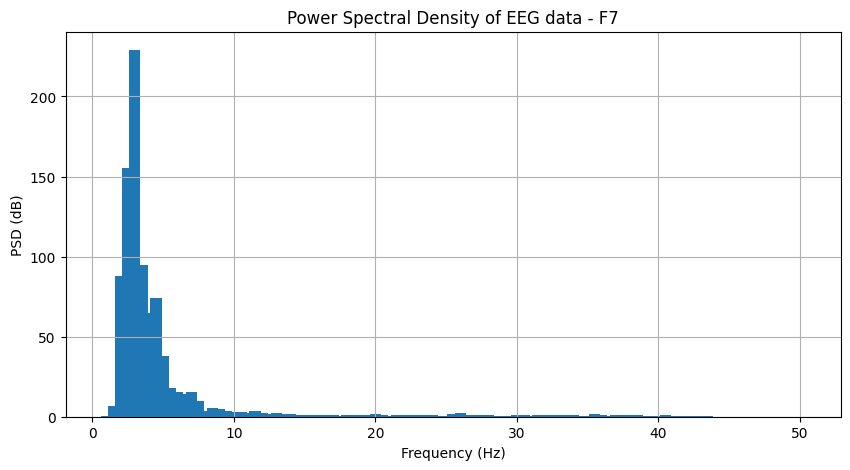

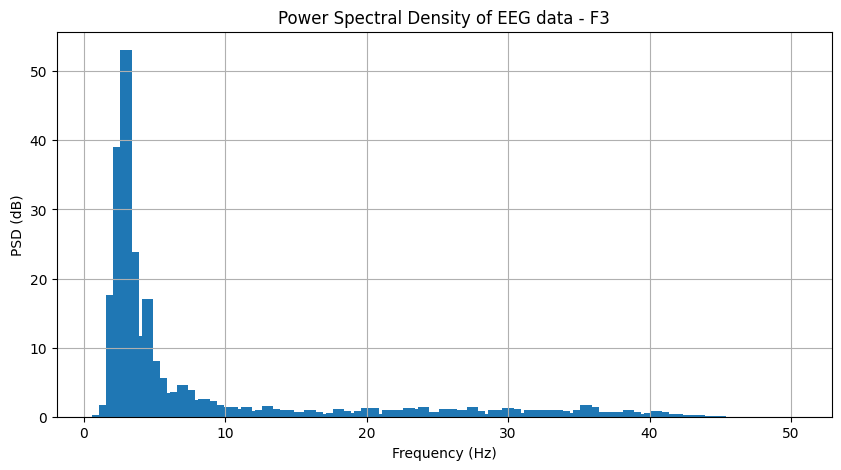

...

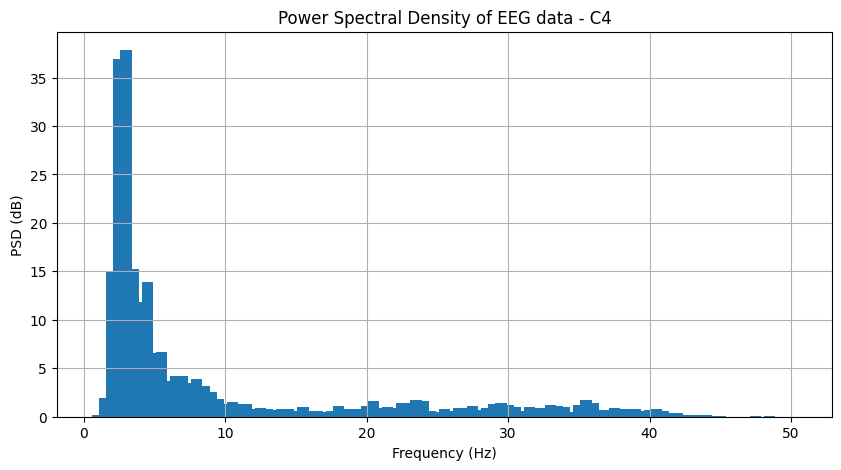

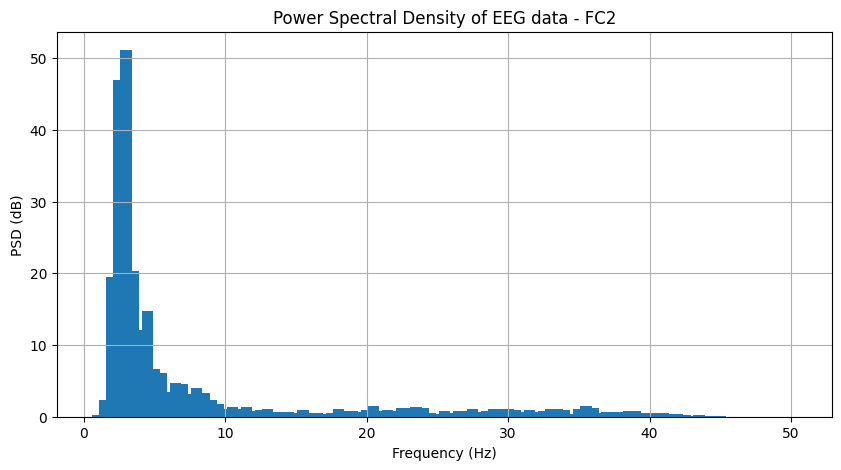

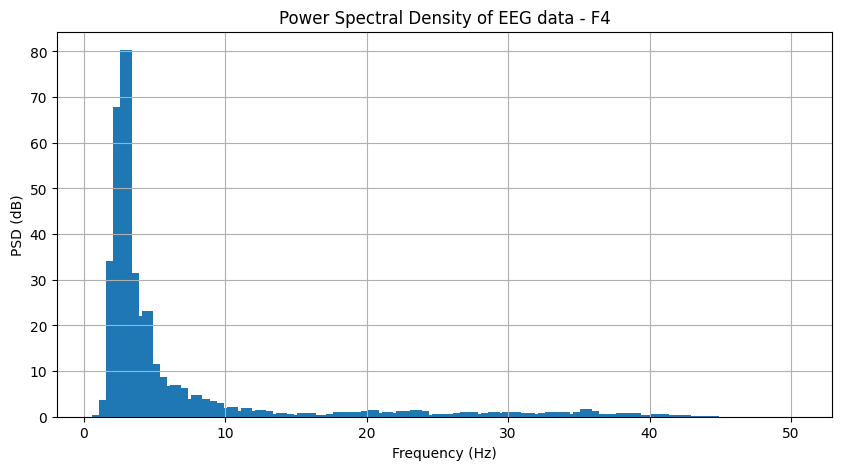

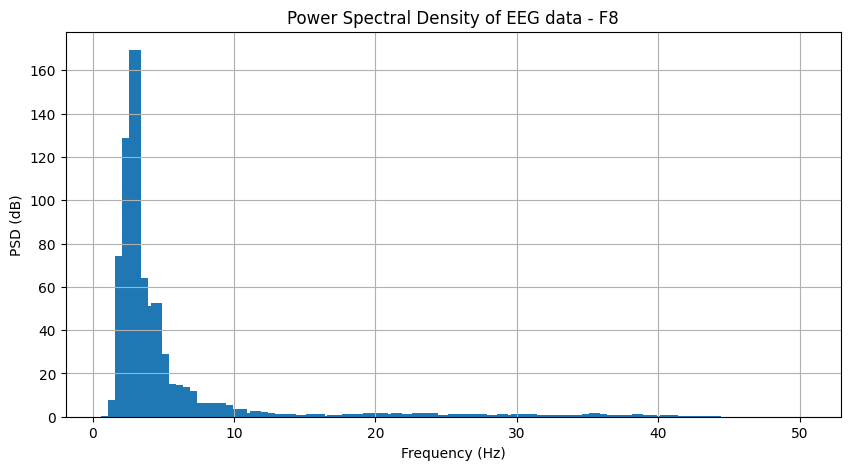

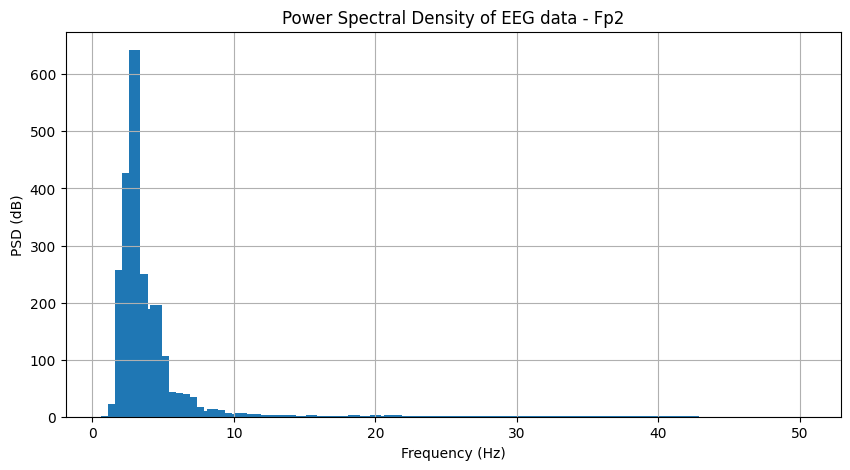

In [ ]:
data = scipy.io.loadmat('/content/Mirror_image_sub_6_trial2.mat')
np_arr = np.array(data['Data'])
sfreq = 128
bands = {'delta': (0.5, 4), 'theta': (4, 8), 'alpha': (8, 13), 'beta': (13, 30), 'gamma': (30, 45)}
frequencies, times, Sxx = spectrogram(np_arr, sfreq)
montage = mne.channels.make_standard_montage('standard_1020')
pos_dict = montage.get_positions()['ch_pos']
pos = np.array([pos_dict[ch_name][:2] for ch_name in ch_names])

for i in range(len(times)):
    psd = Sxx[:, :, i]
    psd_bands = {band: np.mean(psd[:, (frequencies >= fmin) & (frequencies <= fmax)], axis=1) for band, (fmin, fmax) in bands.items()}

psd, freqs = mne.time_frequency.psd_array_welch(raw.get_data(), sfreq, fmin=1., fmax=50.)
for i in range(psd.shape[0]):
    plt.figure(figsize=(10, 5))
    plt.bar(freqs, psd[i, :])
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('PSD (dB)')
    plt.title('Power Spectral Density of EEG data - ' ch_names[i])
    plt.grid(True)
    plt.show()

In [ ]:
len(data)

4